

### Exploratory Data Analysis on YouTube Dataset

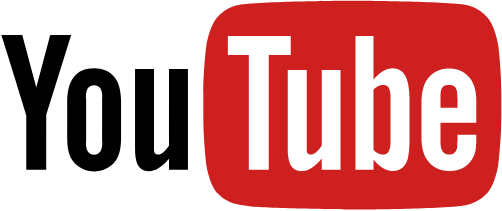

#### Importing Packages

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing

import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
import json
from matplotlib import cm
from datetime import datetime
import glob
import re

In [3]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

### Importing First Dataset

In [4]:
data = pd.read_csv(r"E:\MDS_SEM2\New folder\Machine_Learning\Lab\program_1\data\CAvideos.csv")
data.head()

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description
0,n1WpP7iowLc,17.14.11,Eminem - Walk On Water (Audio) ft. Beyoncé,EminemVEVO,10,2017-11-10T17:00:03.000Z,"Eminem|""Walk""|""On""|""Water""|""Aftermath/Shady/In...",17158579,787425,43420,125882,https://i.ytimg.com/vi/n1WpP7iowLc/default.jpg,False,False,False,Eminem's new track Walk on Water ft. Beyoncé i...
1,0dBIkQ4Mz1M,17.14.11,PLUSH - Bad Unboxing Fan Mail,iDubbbzTV,23,2017-11-13T17:00:00.000Z,"plush|""bad unboxing""|""unboxing""|""fan mail""|""id...",1014651,127794,1688,13030,https://i.ytimg.com/vi/0dBIkQ4Mz1M/default.jpg,False,False,False,STill got a lot of packages. Probably will las...
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,23,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146035,5339,8181,https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg,False,False,False,WATCH MY PREVIOUS VIDEO ▶ \n\nSUBSCRIBE ► http...
3,d380meD0W0M,17.14.11,I Dare You: GOING BALD!?,nigahiga,24,2017-11-12T18:01:41.000Z,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095828,132239,1989,17518,https://i.ytimg.com/vi/d380meD0W0M/default.jpg,False,False,False,I know it's been a while since we did this sho...
4,2Vv-BfVoq4g,17.14.11,Ed Sheeran - Perfect (Official Music Video),Ed Sheeran,10,2017-11-09T11:04:14.000Z,"edsheeran|""ed sheeran""|""acoustic""|""live""|""cove...",33523622,1634130,21082,85067,https://i.ytimg.com/vi/2Vv-BfVoq4g/default.jpg,False,False,False,🎧: https://ad.gt/yt-perfect\n💰: https://atlant...


###### Variable Description
1)video_id: unique ID number to each video

2)trending_date: date of the video was trend

3)title: video title

4)channel_title: channel title

5)category_id: ID number of a video's region

6)publish_time: time of the video is published

7)tags: tags about the video

8)views: number of views of a video

9)likes: number of likes of a video

10)dislikes: number of dislikes of a video

11)comment_count: number of comments about a video

12)thumbnail_link: thumbnail link

13)comments_disabled: comments are disabled(True) or comments are available(False)

14)ratings_disabled: ratings are disabled(True) or ratings are available(False)

15)video_error_or_removed: video gives error/removed(True) or video is available(False)

16)description: descriptions under the video

In [5]:
data.shape

(40881, 16)

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40881 entries, 0 to 40880
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   video_id                40881 non-null  object
 1   trending_date           40881 non-null  object
 2   title                   40881 non-null  object
 3   channel_title           40881 non-null  object
 4   category_id             40881 non-null  int64 
 5   publish_time            40881 non-null  object
 6   tags                    40881 non-null  object
 7   views                   40881 non-null  int64 
 8   likes                   40881 non-null  int64 
 9   dislikes                40881 non-null  int64 
 10  comment_count           40881 non-null  int64 
 11  thumbnail_link          40881 non-null  object
 12  comments_disabled       40881 non-null  bool  
 13  ratings_disabled        40881 non-null  bool  
 14  video_error_or_removed  40881 non-null  bool  
 15  de

###### Here, we can understand from this output that; our data has 16 columns and 40949 rows.

bool(3): comments_disabled, ratings_disabled, video_error_or_removed

int64(5): category_id, views, likes, dislikes, comment_count

object(8): video_id, trending_date, title, channel_title, publish_time, tags, thumbnail_link, description

In [7]:
data.describe()

,category_id,views,likes,dislikes,comment_count
count,40881.000000,4.088100e+04,4.088100e+04,4.088100e+04,4.088100e+04
mean,20.795553,1.147036e+06,3.958269e+04,2.009195e+03,5.042975e+03
std,6.775054,3.390913e+06,1.326895e+05,1.900837e+04,2.157902e+04
min,1.000000,7.330000e+02,0.000000e+00,0.000000e+00,0.000000e+00
25%,20.000000,1.439020e+05,2.191000e+03,9.900000e+01,4.170000e+02
50%,24.000000,3.712040e+05,8.780000e+03,3.030000e+02,1.301000e+03
75%,24.000000,9.633020e+05,2.871700e+04,9.500000e+02,3.713000e+03
max,43.000000,1.378431e+08,5.053338e+06,1.602383e+06,1.114800e+06


### Importing Second Dataset

In [8]:
with open(r'E:\MDS_SEM2\New folder\Machine_Learning\Lab\program_1\data\CA_category_id.json') as json_file:
    datay = json.load(json_file)

datay['items'][3]['id']
for i in range(len(datay['items'])):
    print(datay['items'][i]['snippet']['title'])


Film & Animation
Autos & Vehicles
Music
Pets & Animals
Sports
Short Movies
Travel & Events
Gaming
Videoblogging
People & Blogs
Comedy
Entertainment
News & Politics
Howto & Style
Education
Science & Technology
Movies
Anime/Animation
Action/Adventure
Classics
Comedy
Documentary
Drama
Family
Foreign
Horror
Sci-Fi/Fantasy
Thriller
Shorts
Shows
Trailers


## Data Cleaning

#### Cleaning the publish_time and trending_date columns

In [9]:
dateparse1 = lambda x: pd.datetime.strptime(x, '%y.%d.%m')
data['trending_date'] = data.trending_date.apply(dateparse1)
dateparse2 = lambda x: pd.datetime.strptime(x, '%Y-%m-%dT%H:%M:%S.%fZ')
data['publish_time'] = data.publish_time.apply(dateparse2)

<ipython-input-9-3298e5038d32>:1: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  dateparse1 = lambda x: pd.datetime.strptime(x, '%y.%d.%m')
<ipython-input-9-3298e5038d32>:3: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  dateparse2 = lambda x: pd.datetime.strptime(x, '%Y-%m-%dT%H:%M:%S.%fZ')


In [10]:
data.insert(4, 'publish_date', data.publish_time.dt.date)
data['publish_time'] = data.publish_time.dt.time
data.head()

,video_id,trending_date,title,channel_title,publish_date,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description
0,n1WpP7iowLc,2017-11-14,Eminem - Walk On Water (Audio) ft. Beyoncé,EminemVEVO,2017-11-10,10,17:00:03,"Eminem|""Walk""|""On""|""Water""|""Aftermath/Shady/In...",17158579,787425,43420,125882,https://i.ytimg.com/vi/n1WpP7iowLc/default.jpg,False,False,False,Eminem's new track Walk on Water ft. Beyoncé i...
1,0dBIkQ4Mz1M,2017-11-14,PLUSH - Bad Unboxing Fan Mail,iDubbbzTV,2017-11-13,23,17:00:00,"plush|""bad unboxing""|""unboxing""|""fan mail""|""id...",1014651,127794,1688,13030,https://i.ytimg.com/vi/0dBIkQ4Mz1M/default.jpg,False,False,False,STill got a lot of packages. Probably will las...
2,5qpjK5DgCt4,2017-11-14,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,2017-11-12,23,19:05:24,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146035,5339,8181,https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg,False,False,False,WATCH MY PREVIOUS VIDEO ▶ \n\nSUBSCRIBE ► http...
3,d380meD0W0M,2017-11-14,I Dare You: GOING BALD!?,nigahiga,2017-11-12,24,18:01:41,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095828,132239,1989,17518,https://i.ytimg.com/vi/d380meD0W0M/default.jpg,False,False,False,I know it's been a while since we did this sho...
4,2Vv-BfVoq4g,2017-11-14,Ed Sheeran - Perfect (Official Music Video),Ed Sheeran,2017-11-09,10,11:04:14,"edsheeran|""ed sheeran""|""acoustic""|""live""|""cove...",33523622,1634130,21082,85067,https://i.ytimg.com/vi/2Vv-BfVoq4g/default.jpg,False,False,False,🎧: https://ad.gt/yt-perfect\n💰: https://atlant...


In [11]:
full_df = data.reset_index().sort_values('trending_date').set_index('video_id')
df = data.reset_index().sort_values('trending_date').drop_duplicates('video_id', keep='last').set_index('video_id')
df.head()

,index,trending_date,title,channel_title,publish_date,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description
video_id,,,,,,,,,,,,,,,,,
pVu4zRW5eso,127,2017-11-14,OMG! MY ANTS ARE LEARNING!,AntsCanada,2017-11-13,15,11:22:25,"ants|""antscanada""|""mikey bustos""|""myrmecology""...",152118,9642,129,6095,https://i.ytimg.com/vi/pVu4zRW5eso/default.jpg,False,False,False,Click here to SUBSCRIBE: https://goo.gl/tlCQJZ...
JdHovvb0KD4,128,2017-11-14,Pres. Trump: Putin's Denials Of Interference I...,The View,2017-11-13,25,16:10:21,"donald trump|""vladimir putin""|""the view""|""hot ...",72253,1217,146,569,https://i.ytimg.com/vi/JdHovvb0KD4/default.jpg,False,False,False,NaN
QEBTK5_dRZ0,129,2017-11-14,The Alt-Right Is Crushing On Taylor Swift,The Young Turks,2017-11-13,25,02:00:00,"171107__TB01TaylorSwift|""News""|""Politics""|""The...",100394,1619,907,1595,https://i.ytimg.com/vi/QEBTK5_dRZ0/default.jpg,False,False,False,Some white supremacists are latching on to lyr...
JccE_V5q0-Q,130,2017-11-14,Canada's Trudeau charms Manila as he orders fr...,News Center,2017-11-12,22,14:06:59,"news|""haber""|""breaking news""|""أخبار عاجلة""|""по...",30001,221,7,101,https://i.ytimg.com/vi/JccE_V5q0-Q/default.jpg,False,False,False,Canadian Prime Minister Justin Trudeau hopped ...
O-_52G3aKVU,131,2017-11-14,Taylor Swift SNL Call It What You Want on Satu...,vSpirit2,2017-11-12,10,09:23:20,[none],62915,1007,21,55,https://i.ytimg.com/vi/O-_52G3aKVU/default.jpg,False,False,False,"On Saturday Night Live November 11, 2017, Tayl..."


##### There are two sets of data:
df, which removed duplicated data by keeping only last entry since it contains the latest stats

full_df, which contains all entries.

### Joining Category ID

In [12]:
idP = []

for i in range(30):
    idP.append(datay['items'][i]['id'])
    

In [13]:
title = []
for i in range(30):
    title.append(datay['items'][i]['snippet']['title'])


In [14]:
d = {'id': idP, 'title': title}

df2=pd.DataFrame(d)
df2



,id,title
0,1,Film & Animation
1,2,Autos & Vehicles
2,10,Music
3,15,Pets & Animals
4,17,Sports
5,18,Short Movies
6,19,Travel & Events
7,20,Gaming
8,21,Videoblogging
9,22,People & Blogs


In [15]:
df2.id = df2.id.astype(int)
df2.dtypes
df3 = pd.merge(df,df2, left_on='category_id', right_on='id')
df3

,index,trending_date,title_x,channel_title,publish_date,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,id,title_y
0,127,2017-11-14,OMG! MY ANTS ARE LEARNING!,AntsCanada,2017-11-13,15,11:22:25,"ants|""antscanada""|""mikey bustos""|""myrmecology""...",152118,9642,129,6095,https://i.ytimg.com/vi/pVu4zRW5eso/default.jpg,False,False,False,Click here to SUBSCRIBE: https://goo.gl/tlCQJZ...,15,Pets & Animals
1,53,2017-11-14,SHOPPING FOR NEW FISH!!!,The king of DIY,2017-11-12,15,18:30:01,"shopping for new fish|""new fish""|""aquarium fis...",207532,7473,246,2120,https://i.ytimg.com/vi/TaTleo4cOs8/default.jpg,False,False,False,Today we go shopping for new fish for some of ...,15,Pets & Animals
2,543,2017-11-16,ALL MY NEW FISH!!,The king of DIY,2017-11-14,15,21:30:00,"Aquarium|""aquarium fish""|""uarujoey""|""aquarium ...",195715,7670,231,2470,https://i.ytimg.com/vi/YTiYQwk7Bw0/default.jpg,False,False,False,I'll post more photos and videos off all these...,15,Pets & Animals
3,912,2017-11-18,What will happen to Frank?,The king of DIY,2017-11-16,15,19:00:01,"aquarium|""frank the flowerhorn""|""flowerhorn""|""...",180385,6612,130,3509,https://i.ytimg.com/vi/4T4mt9MuHEI/default.jpg,False,False,False,I know im not going to be able to make another...,15,Pets & Animals
4,972,2017-11-18,DIY - Simon's Cat | NEW BLACK & WHITE!,Simon's Cat,2017-11-16,15,15:03:23,"diy|""electric drill""|""cats""|""cartoon""|""simons ...",336907,18768,177,603,https://i.ytimg.com/vi/9PhM-zCmTFs/default.jpg,False,False,False,'A curious cat helps his owner with home impro...,15,Pets & Animals
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24373,39757,2018-06-09,"Priyamanaval Episode 1036, 08/06/18",VikatanTV,2018-06-08,43,17:00:03,"Priyamanaval 08.06.2018|""Priyamanaval today Ep...",565220,3669,1188,561,https://i.ytimg.com/vi/R_5YBLuXAuU/default.jpg,False,False,False,Priyamanaval Episode 1036Subscribe: https://go...,43,Shows
24374,40341,2018-06-12,"Priyamanaval Episode 1038, 11/06/18",VikatanTV,2018-06-11,43,17:00:01,"Priyamanaval 11.06.2018|""Priyamanaval today Ep...",613807,4058,1084,666,https://i.ytimg.com/vi/2XEWN0CFghA/default.jpg,False,False,False,Priyamanaval Episode 1038Subscribe: https://go...,43,Shows
24375,40574,2018-06-13,"Priyamanaval Episode 1039, 12/06/18",VikatanTV,2018-06-12,43,17:00:03,"priyamanaval episode 1039|""Priyamanaval 12.06....",565091,3581,1408,710,https://i.ytimg.com/vi/G7dUVIij4AA/default.jpg,False,False,False,Priyamanaval Episode 1039Subscribe: https://go...,43,Shows
24376,40780,2018-06-14,"Priyamanaval Episode 1040, 13/06/18",VikatanTV,2018-06-13,43,17:00:04,"priyamanaval episode 1040|""Priyamanaval 13.06....",535254,3105,1403,898,https://i.ytimg.com/vi/tR5FZC2FP-U/default.jpg,False,False,False,Priyamanaval Episode 1040Subscribe: https://go...,43,Shows


In [16]:
df4=df3.insert(4, 'category', df3.title_y)
df3.drop(columns='title_y')
df = df3
df = df.set_index('trending_date').drop(columns=['title_y'])
df = df.drop(columns=['id'])

In [17]:
df.head(5)

,index,title_x,channel_title,category,publish_date,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description
trending_date,,,,,,,,,,,,,,,,,
2017-11-14,127,OMG! MY ANTS ARE LEARNING!,AntsCanada,Pets & Animals,2017-11-13,15,11:22:25,"ants|""antscanada""|""mikey bustos""|""myrmecology""...",152118,9642,129,6095,https://i.ytimg.com/vi/pVu4zRW5eso/default.jpg,False,False,False,Click here to SUBSCRIBE: https://goo.gl/tlCQJZ...
2017-11-14,53,SHOPPING FOR NEW FISH!!!,The king of DIY,Pets & Animals,2017-11-12,15,18:30:01,"shopping for new fish|""new fish""|""aquarium fis...",207532,7473,246,2120,https://i.ytimg.com/vi/TaTleo4cOs8/default.jpg,False,False,False,Today we go shopping for new fish for some of ...
2017-11-16,543,ALL MY NEW FISH!!,The king of DIY,Pets & Animals,2017-11-14,15,21:30:00,"Aquarium|""aquarium fish""|""uarujoey""|""aquarium ...",195715,7670,231,2470,https://i.ytimg.com/vi/YTiYQwk7Bw0/default.jpg,False,False,False,I'll post more photos and videos off all these...
2017-11-18,912,What will happen to Frank?,The king of DIY,Pets & Animals,2017-11-16,15,19:00:01,"aquarium|""frank the flowerhorn""|""flowerhorn""|""...",180385,6612,130,3509,https://i.ytimg.com/vi/4T4mt9MuHEI/default.jpg,False,False,False,I know im not going to be able to make another...
2017-11-18,972,DIY - Simon's Cat | NEW BLACK & WHITE!,Simon's Cat,Pets & Animals,2017-11-16,15,15:03:23,"diy|""electric drill""|""cats""|""cartoon""|""simons ...",336907,18768,177,603,https://i.ytimg.com/vi/9PhM-zCmTFs/default.jpg,False,False,False,'A curious cat helps his owner with home impro...


In [18]:
df.category.unique()

array(['Pets & Animals', 'News & Politics', 'People & Blogs', 'Music',
       'Entertainment', 'Travel & Events', 'Education', 'Sports',
       'Gaming', 'Howto & Style', 'Film & Animation', 'Comedy',
       'Science & Technology', 'Autos & Vehicles', 'Shows', 'Movies'],
      dtype=object)

## Exploratory Data Analysis

### What kinds of videos make it to the trending list worldwide?

In [19]:
fig = px.histogram(df, x=df['category'])

fig.update_layout(title = {'text':'Number of videos sorted by category',
                           'y':0.95,
                           'x':0.5},
                 xaxis_title='',
                 yaxis_title='Count',
                 template='seaborn')

fig.show()


####  Observation
The videos Belonging to the Entertainment Category is more trending, followed by News and Politics, and People and Blogs.

### Normalization

In [20]:
categorys = df["category"].value_counts(normalize=True).reset_index()
# rename columns names
categorys.rename(columns={"index":"Category","category":"count"},inplace=True)
# we use style background ¡
categorys.style.background_gradient(cmap='mako_r')

,Category,count
0,Entertainment,0.338215
1,News & Politics,0.120601
2,People & Blogs,0.104726
3,Comedy,0.079867
4,Sports,0.079252
5,Music,0.064320
6,Howto & Style,0.052178
7,Film & Animation,0.047215
8,Gaming,0.031627
9,Science & Technology,0.026089


## Corelation matrix

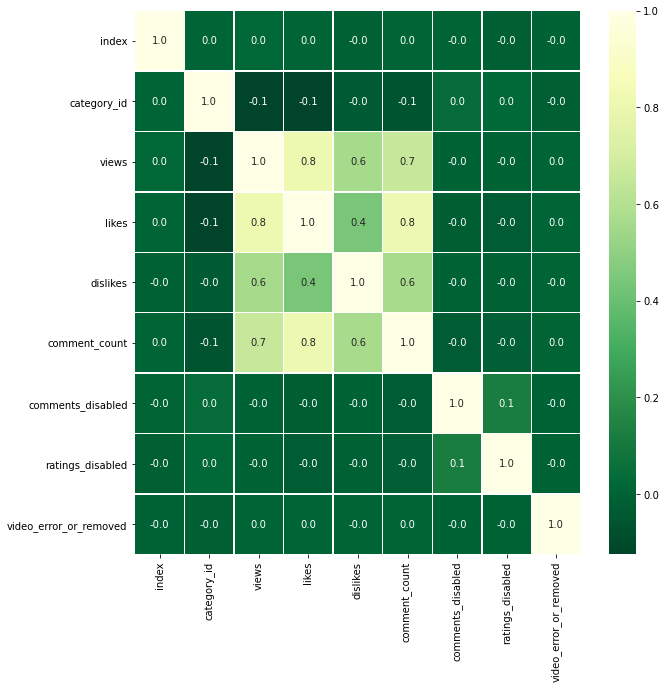

In [21]:
f,ax = plt.subplots(figsize=(10, 10))
sns.heatmap(df.corr(), annot=True, linewidths=.5, fmt= '.1f',ax=ax,cmap='YlGn_r')
plt.show()

Text(0.5, 1.0, 'Likes v/s Views')

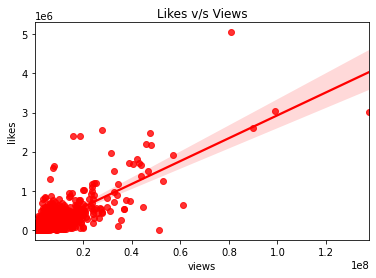

In [22]:
sns.regplot(x='views',y='likes',data=df,color='red').set_title('Likes v/s Views')

Text(0.5, 1.0, 'Comment v/s Views')

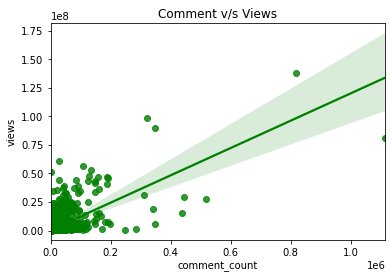

In [23]:
sns.regplot(x='comment_count',y='views',data=df,color='green').set_title('Comment v/s Views')

Text(0.5, 1.0, 'Likes v/s Commment')

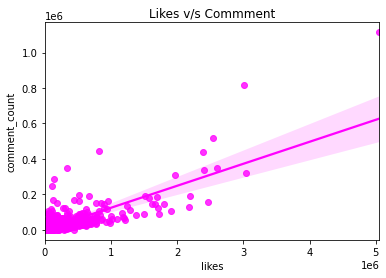

In [24]:
sns.regplot(x='likes',y='comment_count',data=df,color='magenta').set_title('Likes v/s Commment')

# What categories do the top 100 trending videos (by views) belong to?

In [25]:
m=df.sort_values(by='views', ascending=False).head(100).groupby(by='category').count()[['views']]
p=m.sort_values(by='views',ascending=False)
p.style.background_gradient(cmap='mako_r')

,views
category,
Music,63
Entertainment,20
Film & Animation,7
Sports,5
People & Blogs,2
Science & Technology,2
Howto & Style,1


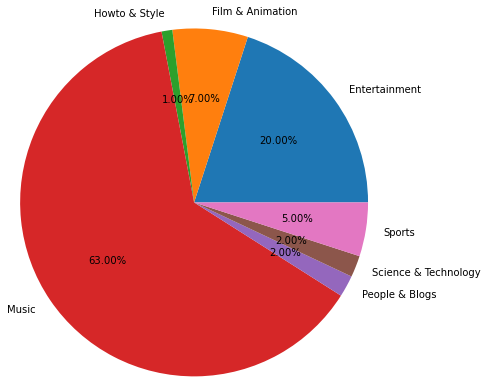

In [26]:
df_val = df.sort_values(by='views', ascending=False).head(100).groupby(by='category').count().title_x
df_index = df.sort_values(by='views', ascending=False).head(100).groupby(by='category').count().index
#fig = px.pie(df_val, values=df_index, names=df_index, title='Reigon wise Profit Earned')
#fig.show()
plt.pie(df_val, labels=df_index, radius = 2, autopct = '%0.2f%%')
plt.show()

#### Observation:
The most popular (most viewed) trending videos are predominantly music videos.
The second most popular are entertainment videos. However, this is also because there are far fewer trending music videos than there are of other category as music videos stay trending for longer, as we shall see below.

### Which Category Gets Maximum Likes?

In [27]:
fig = px.histogram(df, x=df['category'],y=df['likes'],color=df['category'],color_discrete_sequence=['yellow'])

fig.update_layout(title = {'text':'Category v/s likes',
                           'y':0.95,
                           'x':0.5},
                 xaxis_title='',
                 yaxis_title='Count_of_likes',
                 template='seaborn')

fig.show()


### Which Category Gets Maximum Comments?

In [28]:
fig = px.histogram(df, x=df['category'],y=df['comment_count'],color=df['category'],color_discrete_sequence=['green'])

fig.update_layout(title = {'text':'Category v/s Comment',
                           'y':0.95,
                           'x':0.5},
                 xaxis_title='',
                 yaxis_title='Count_of_comments',
                 template='seaborn')

fig.show()


## Which category gets maximum Dislikes?

In [29]:
fig = px.histogram(df, x=df['category'],y=df['dislikes'],color=df['category'],color_discrete_sequence=['magenta'])

fig.update_layout(title = {'text':'Category v/s Dislikes',
                           'y':0.95,
                           'x':0.5},
                 xaxis_title='',
                 yaxis_title='Count_of_dislikes',
                 template='seaborn')

fig.show()


### Checking Skewness

In [30]:
print("Views quantiles")
print(df['views'].quantile([.01,.25,.5,.75,.99]))
print('---------------------------')
print('Likes quantiles')
print(df['likes'].quantile([.01,.25,.5,.75,.99]))
print('---------------------------')
print('Disikes quantiles')
print(df['dislikes'].quantile([.01,.25,.5,.75,.99]))
print('---------------------------')
print('Comments quantiles')
print(df['comment_count'].quantile([.01,.25,.5,.75,.99]))
print('---------------------------')


Views quantiles
0.01       4937.54
0.25     114218.00
0.50     288218.00
0.75     718732.75
0.99    9315731.50
Name: views, dtype: float64
---------------------------
Likes quantiles
0.01        10.00
0.25      1522.50
0.50      5545.50
0.75     18764.00
0.99    335625.65
Name: likes, dtype: float64
---------------------------
Disikes quantiles
0.01        0.00
0.25       75.00
0.50      223.00
0.75      678.00
0.99    17016.92
Name: dislikes, dtype: float64
---------------------------
Comments quantiles
0.01        0.00
0.25      299.00
0.50      966.00
0.75     2592.00
0.99    39474.95
Name: comment_count, dtype: float64
---------------------------


The data is extremely skewed with a big gap between the first 75% and the last 25%

* 75% of views are less than 7L and the last 25% goes upto 2.5 B

* 75% of likes are less than 40 K and the last 25% goes upto 800 K

* 75% of dislikes are less than 700 and the last 25% goes upto 17 K

* 75% of comments are less than 2K and the least 25% goes upto 39 K

### Log Transform
We will logarithmize the data to fix the above mentioned problem as the they will play a big role in a boxplot

In [31]:
df['views_log'] = np.log(df['views'] + 1)
df['likes_log'] = np.log(df['likes'] + 1)
df['dislikes_log'] = np.log(df['dislikes'] + 1)
df['comments_log'] = np.log(df['comment_count'] + 1)

## Views distribution by category

In [32]:
fig = px.box(df, x=df['category'], y=df['views_log'])

fig.update_layout(title = {'text':'Views distribution by category',
                           'y':0.95,
                           'x':0.5},
                 xaxis_title='',
                 yaxis_title='views',
                 template='seaborn',
                 )

fig.show()

## Likes distribution by category

In [33]:
fig = px.box(df, x=df['category'], y=df['likes_log'],color=df['category'],
                color_discrete_sequence=[ "goldenrod"])

fig.update_layout(title = {'text':'Likes distribution by category',
                           'y':0.95,
                           'x':0.5},
                 xaxis_title='',
                 yaxis_title='likes_log',
                 template='seaborn')

fig.show()


### Dislikes distribution by category¶

In [34]:
fig = px.box(df, x=df['category'], y=df['dislikes_log'],color=df['category'],
                color_discrete_sequence=[ 'darkturquoise'])

fig.update_layout(title = {'text':'Dislikes distribution by category',
                           'y':0.95,
                           'x':0.5},
                 xaxis_title='',
                 yaxis_title='dislikes_log',
                 template='seaborn')

fig.show()

### Comments distribution by category

In [35]:
fig = px.box(df, x=df['category'], y=df['comments_log'],color=df['category'],
                color_discrete_sequence=[ 'mediumorchid'])

fig.update_layout(title = {'text':'Comments distribution by category',
                           'y':0.95,
                           'x':0.5},
                 xaxis_title='',
                 yaxis_title='comments_log',
                 template='seaborn')

fig.show()


Music and Science&Technology have have the highest engagement in all the quartiles

- Fourth quartile: Music is the highest in all 4 metrics

- Third quartile: Music is the highest in all 4 metrics

- Second quartile: Gaming and music are the highest in all 4 metrics

- First quartile: Music , comedy and gaming are the highest in all 4 metrics

- Min value: Education is the highest in all 4 metrics


### Visualize top 10 by feature

In [36]:
def top_10(df, col, num=10):
    sort_df = df.sort_values(col, ascending=False).iloc[:num]
    
    fig = px.bar(sort_df, x=sort_df['title_x'], y=sort_df[col],color=sort_df['title_x'],
                color_discrete_sequence=["mediumaquamarine",'yellowgreen','mediumorchid','rebeccapurple','slateblue',' papayawhip','lightsalmon',"chocolate",
                                        ])
    
    labels = []
    for item in sort_df['title_x']:
        labels.append(item[:10] + '...')
        
    fig.update_layout(title = {'text':'Top {} videos with the highest {}'.format(num, col),
                           'y':0.95,
                           'x':0.4,
                            'xanchor':'center',
                            'yanchor':'top'},
                 xaxis_title='',
                 yaxis_title=col,
                     xaxis = dict(ticktext=labels))
  
    fig.show()
    
    return sort_df[[ 'title_x', 'channel_title','category', col]]

### Top 10 videos with the highest views

In [37]:
top_10(df, 'views', 10)

,title_x,channel_title,category,views
trending_date,,,,
2017-12-13,YouTube Rewind: The Shape of 2017 | #YouTubeRe...,YouTube Spotlight,Entertainment,137843120
2018-05-13,Childish Gambino - This Is America (Official V...,ChildishGambinoVEVO,Music,98938809
2017-12-07,Marvel Studios' Avengers: Infinity War Officia...,Marvel Entertainment,Entertainment,89930713
2018-05-23,BTS (방탄소년단) 'FAKE LOVE' Official MV,ibighit,Music,80738011
2018-03-06,Nicky Jam x J. Balvin - X (EQUIS) | Video Ofic...,NickyJamTV,Music,61163906
2017-11-22,"Luis Fonsi, Demi Lovato - Échame La Culpa",LuisFonsiVEVO,Music,56843038
2018-04-30,VENOM - Official Trailer (HD),Sony Pictures Entertainment,Entertainment,53071887
2018-02-10,To Our Daughter,Kylie Jenner,People & Blogs,51243149
2018-06-06,Maroon 5 - Girls Like You ft. Cardi B,Maroon5VEVO,Music,47778378


### Top 10 videos with the highest likes

In [38]:
top_10(df, 'likes')

,title_x,channel_title,category,likes
trending_date,,,,
2018-05-23,BTS (방탄소년단) 'FAKE LOVE' Official MV,ibighit,Music,5053338
2018-05-13,Childish Gambino - This Is America (Official V...,ChildishGambinoVEVO,Music,3037318
2017-12-13,YouTube Rewind: The Shape of 2017 | #YouTubeRe...,YouTube Spotlight,Entertainment,3014479
2017-12-07,Marvel Studios' Avengers: Infinity War Officia...,Marvel Entertainment,Entertainment,2606665
2017-11-28,BTS (방탄소년단) 'MIC Drop (Steve Aoki Remix)' Offi...,ibighit,Music,2542863
2018-02-24,Drake - God’s Plan,DrakeVEVO,Music,2469057
2018-05-09,BTS (방탄소년단) LOVE YOURSELF 轉 Tear 'Singularity'...,ibighit,Music,2407419
2018-03-03,j-hope 'Daydream (백일몽)' MV,ibighit,Music,2392594
2018-04-25,Ariana Grande - No Tears Left To Cry,ArianaGrandeVevo,Music,2195120


### Top 10 videos with the highest Dislikes

In [39]:
top_10(df, 'dislikes')

,title_x,channel_title,category,dislikes
trending_date,,,,
2017-12-13,YouTube Rewind: The Shape of 2017 | #YouTubeRe...,YouTube Spotlight,Entertainment,1602383
2017-11-28,Jake Paul - It's Everyday Bro (Remix) [feat. G...,Jake Paul,People & Blogs,504340
2017-11-15,Jake Paul - Saturday Night (Song) feat. Nick C...,Jake Paul,People & Blogs,200391
2017-12-17,PSA from Chairman of the FCC Ajit Pai,Daily Caller,People & Blogs,190227
2018-05-21,Official Call of Duty®: Black Ops 4 — Multipla...,Call of Duty,Gaming,174645
2018-05-23,BTS (방탄소년단) 'FAKE LOVE' Official MV,ibighit,Music,165854
2018-02-25,Fergie Performs The U.S. National Anthem / 201...,MLG Highlights,Sports,164693
2018-05-20,Race 3 | Official Trailer | Salman Khan | Remo...,Salman Khan Films,Entertainment,162731
2018-05-13,Childish Gambino - This Is America (Official V...,ChildishGambinoVEVO,Music,161813


In [40]:
top_10(df, 'comment_count')

,title_x,channel_title,category,comment_count
trending_date,,,,
2018-05-23,BTS (방탄소년단) 'FAKE LOVE' Official MV,ibighit,Music,1114800
2017-12-13,YouTube Rewind: The Shape of 2017 | #YouTubeRe...,YouTube Spotlight,Entertainment,817582
2017-11-28,BTS (방탄소년단) 'MIC Drop (Steve Aoki Remix)' Offi...,ibighit,Music,519092
2018-05-14,CHẠY NGAY ĐI | RUN NOW | SƠN TÙNG M-TP | Offic...,Sơn Tùng M-TP Official,Music,445251
2018-03-03,j-hope 'Daydream (백일몽)' MV,ibighit,Music,437036
2018-04-17,Melting Every Lipstick From Sephora Together,Safiya Nygaard,People & Blogs,349112
2017-12-07,Marvel Studios' Avengers: Infinity War Officia...,Marvel Entertainment,Entertainment,347982
2018-05-09,BTS (방탄소년단) LOVE YOURSELF 轉 Tear 'Singularity'...,ibighit,Music,340125
2018-05-13,Childish Gambino - This Is America (Official V...,ChildishGambinoVEVO,Music,319502


3 entries in all the 4 features, shows that videos with high views are also prone to higher engagement

6 common entries in top 10 views and likes, shows a high correlation between views and likes

3 common entries in top 10 comment_count and dislikes, shows a correlation between comments and dislikes

3 common entries in top 10 comment_count and likes, shows a correlation between comments and likes

comment_count has a correlation with views, likes and dislikes

## CONCLUSION

###### *The videos Belonging to the Entertainment Category is more trending, followed by News and Politics, and People and Blogs.

##### * There is a high corelation between likes and comments, views and likes, and dislikes_log and likes_log

#### *The most popular (most viewed) trending videos are predominantly music videos. The second most popular are entertainment videos.

### In order to predict the Category of YouTube Videos,we can Use the Classification Techniques.


##### Classifiers that can be used:
#### *Multinomial Naive Bayes
#### *Random Forest
#### *Support Vector
#### *K Neighbors
#### *Decision Tree

In [41]:
import collections
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

In [42]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier

In [43]:
vector = CountVectorizer()
counts = vector.fit_transform(df['title_x'].values)

In [44]:
NB_Model = MultinomialNB()
RFC_Model = RandomForestClassifier()
SVC_Model = SVC()
KNC_Model = KNeighborsClassifier()
DTC_Model = DecisionTreeClassifier()

In [46]:
output = df['category_id'].values

In [48]:
NB_Model.fit(counts,output)

MultinomialNB()

In [49]:
RFC_Model.fit(counts,output)

RandomForestClassifier()